In [272]:
import pandas as pd
import numpy as np
from utils import *
from joint_angles.calculate_joint_angles import *
# Import everything needed to edit video clips 
from moviepy.editor import *
# for 3d plots
import plotly.express as px
#for heatmaps
import seaborn as sns

%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


# Projection of 3D points on body frame on validation data

Body frame coordinate is defined as : 
- Center coordinate : Hip
- X-axis : From left shoulder to neck
- Z-axis : From neck to hips
- Y-axis : Z cross X

Where body points in the body frame will be defined as : $p' = R*p + C$

With : 
- $p$ : Coordinate of body point in original frame
- $p'$ : Coordinate of body point in body frame
- $R$ : Rotation matrix defined as :$$R =   \left(\begin{array}{cc} 
                                        X_x & Y_x & Z_x \\
                                        X_y & Y_y & Z_y \\
                                        X_z & Y_z & Z_y
                                        \end{array}\right)$$
    Where $(X_x, X_y, X_z)$ give coordinates of new X-axis in the old frame, and so on.
- $C$ : Coordinate of new center of body frame (which is neck in this case)

In [327]:
data_npy_path = "../data/data_test_31.07.npy"
data_npy = np.load(data_npy_path)

df_test = pd.DataFrame()
df_test['time'] = np.array([time/30 for time in range(len(data_npy))])
for i in range(17):
    df_point = pd.DataFrame(data_npy[:, i])
    df_test[f'point_{i}'] = df_point[[0, 1, 2]].to_numpy().tolist()
    df_test[f'point_{i}'] = [np.array(point) for point in df_test[f'point_{i}']]
df_test.rename(columns = {'point_0': 'nose', 'point_1': 'lefteye',
                          'point_2': 'righteye', 'point_3': 'leftear', 'point_4': 'rightear',
                          'point_5':'leftshoulder', 'point_6':'rightshoulder', 
                          'point_8':'rightelbow', 'point_7':'leftelbow', 
                          'point_10':'rightwrist', 'point_9':'leftwrist',
                          'point_12':'righthip', 'point_11':'lefthip',
                          'point_13': 'leftknee', 'point_14': 'rightknee',
                          'point_15': 'leftfoot', 'point_16': 'rightfoot'}, inplace = True)

joints = ['leftshoulder_flex', 'rightshoulder_flex', 'leftshoulder_abduc',
       'rightshoulder_abduc', 'leftelbow_flex', 'rightelbow_flex',
       'trunk_forward_flex', 'trunk_lateral_flex', 'trunk_rotation']
df_test['neck'] = (df_test['leftshoulder'] + df_test['rightshoulder'])/2
df_test['hips'] = (df_test['lefthip'] + df_test['righthip'])/2
# Add joints DoF
add_joint_angles(df_test)
#add_joint_velocities(df_test, joints)


(<unknown>:79890): GStreamer-CRITICAL **: 15:49:43.417: gst_element_make_from_uri: assertion 'gst_uri_is_valid (uri)' failed
[ WARN:0@109685.664] global /Users/ec2-user/ci_py311/opencv-suite_1678377996177/work/modules/videoio/src/cap_gstreamer.cpp (2180) open OpenCV | GStreamer warning: cannot link elements
[ERROR:0@109685.665] global /Users/ec2-user/ci_py311/opencv-suite_1678377996177/work/modules/videoio/src/cap.cpp (597) open VIDEOIO(CV_IMAGES): raised OpenCV exception:

OpenCV(4.6.0) /Users/ec2-user/ci_py311/opencv-suite_1678377996177/work/modules/videoio/src/cap_images.cpp:253: error: (-5:Bad argument) CAP_IMAGES: can't find starting number (in the name of file): videos/check_new_body_frame.avi in function 'icvExtractPattern'




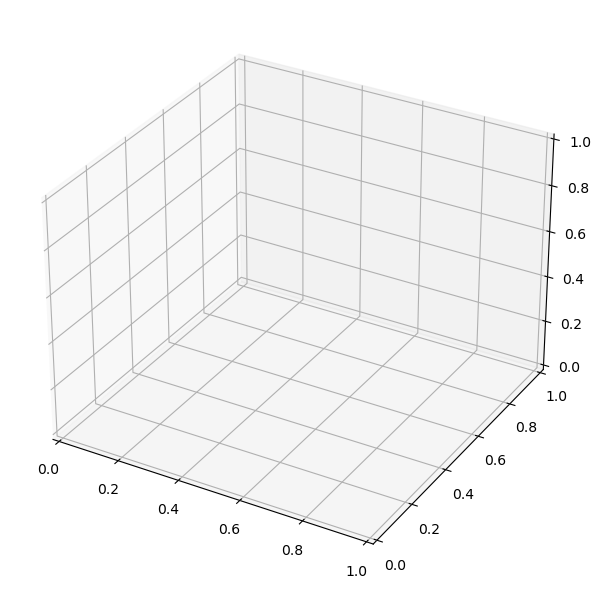

In [308]:
def rotate_points(data):

    X = data['leftshoulder'] - data['neck']
    Z = data['hips'] - data['neck']

    # Axis of coordinate system should be unit vector
    X = [unit_vector(x) for x in X]
    Z = [unit_vector(z) for z in Z]
    Y = np.cross(Z, X)

    #Create rotation matrix
    R = [np.array([x, y, -z]).T for x, y, z in zip(X, Y, Z)]
    C = [np.array(c) for c in data['neck']]

    #new body joints to body frame coordinates
    new_df = pd.DataFrame()
    keys = ['nose', 'lefteye', 'righteye', 'leftear', 'rightear',
       'leftshoulder', 'rightshoulder', 'leftelbow', 'rightelbow',
       'leftwrist', 'rightwrist', 'lefthip', 'righthip', 'leftknee',
       'rightknee', 'leftfoot', 'rightfoot', 'neck', 'hips']
    for key in keys:
        new_df[key] = [np.dot(r, point-c) for r, point, c in zip(R, data[key], C)]

    new_df['time'] = data['time']
    return new_df

new_df_test = rotate_points(df_test)
video_skeleton('check_new_body_frame', new_df_test, 70, 71)

In [329]:
events = {'shoulder_flex' : [65, 98],
          'shoulder_rot' : [99, 132],
          'shoulder_abduc' : [262, 304],
          'elbow_flex' : [133, 192],
          'trunk_fwd_flex' : [192, 214],
          'trunk_lat_flex' : [214, 233],
          'trunk_rot' : [233, 249]}


(<unknown>:79890): GStreamer-CRITICAL **: 17:12:26.033: gst_element_make_from_uri: assertion 'gst_uri_is_valid (uri)' failed
[ WARN:0@113874.438] global /Users/ec2-user/ci_py311/opencv-suite_1678377996177/work/modules/videoio/src/cap_gstreamer.cpp (2180) open OpenCV | GStreamer warning: cannot link elements
[ERROR:0@113874.440] global /Users/ec2-user/ci_py311/opencv-suite_1678377996177/work/modules/videoio/src/cap.cpp (597) open VIDEOIO(CV_IMAGES): raised OpenCV exception:

OpenCV(4.6.0) /Users/ec2-user/ci_py311/opencv-suite_1678377996177/work/modules/videoio/src/cap_images.cpp:253: error: (-5:Bad argument) CAP_IMAGES: can't find starting number (in the name of file): videos/shoulder_flex.avi in function 'icvExtractPattern'




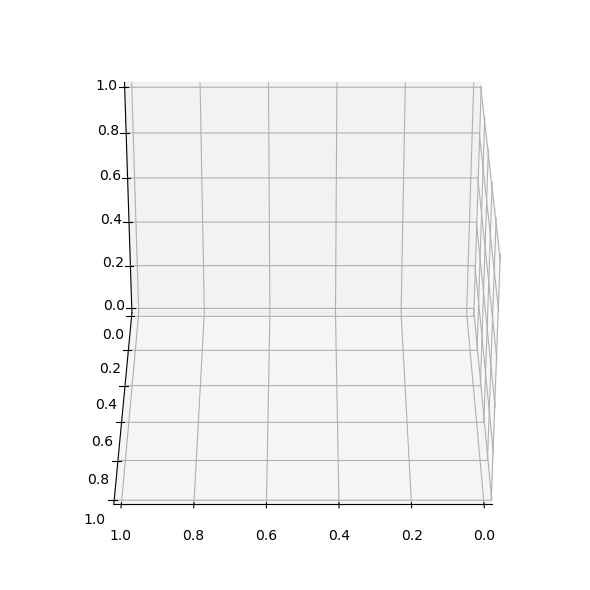

In [337]:
video_skeleton('shoulder_flex', df_test, events['shoulder_flex'][0], events['shoulder_flex'][1])

In [355]:
def angle_plane(data, jointA, jointB, plane):
    D = data[jointB] - data[jointA]
    D = [unit_vector(d) for d in D]
    
    if plane == 'sagittal':
        N = np.array([0, 0, 1])
        D = [np.array([0, d[1], d[2]]) for d in D]
        angle = [np.dot(d, N) for d in D]
        angle = np.arccos(angle)*180/np.pi

        # To define if it is flexion or extension
        for i in range(len(D)):
            norm_front = np.linalg.norm(D[i] - np.array([0, -1, 0]))
            norm_behind = np.linalg.norm(D[i] - np.array([0, 1, 0]))

            if norm_behind < norm_front:
                angle[i] = -angle[i]

    elif plane == 'transverse':
        N = np.array([1, 0, 0])
        D = [np.array([d[0], d[1], 0]) for d in D]
        angle = [np.dot(d, N) for d in D]
        angle = np.arccos(angle)*180/np.pi

    elif plane =='coronal':
        N = np.array([0, 0, 1])
        D = [np.array([d[0], 0, d[2]]) for d in D]
        angle = [np.dot(d, N) for d in D]
        angle = np.arccos(angle)*180/np.pi
        # To define if it is on one side or the other
        for i in range(len(D)):
            norm_left = np.linalg.norm(D[i] - np.array([1, 0, 0]))
            norm_right = np.linalg.norm(D[i] - np.array([-1, 0, 0]))
                

            """ if 'left' in jointA and norm_right < norm_left:
                angle[i] = -angle[i]

            if 'right' in jointA and norm_left < norm_right:
                angle[i] = -angle[i] """
        #To check if it is past

    #N_norm = [np.linalg.norm(n) for n in N]

    #D_proj = [d - unit_vector((np.dot(d, n)/norm**2)*n) for d, n, norm in zip(D, N, N_norm)]

    #only for shoulder flexion for now
    #Here it is simply the angle between the projected arm and the new z axis

    return angle

### Check for shoulder flexion

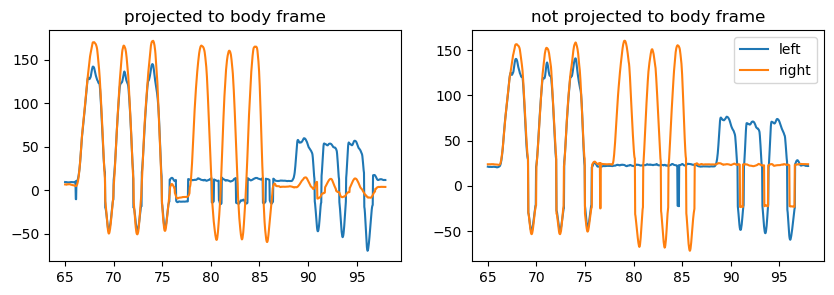

In [347]:
leftshoulder_flex = angle_plane(new_df_test, 'leftelbow', 'leftshoulder', 'sagittal')
rightshoulder_flex = angle_plane(new_df_test, 'rightelbow', 'rightshoulder', 'sagittal')
t1, t2 = time_id(new_df_test, events['shoulder_flex'][0], events['shoulder_flex'][1])

fig = plt.figure(figsize=(10,3))
plt.subplot(1, 2, 1)
plt.plot(new_df_test['time'][t1:t2], leftshoulder_flex[t1:t2], label = 'left')
plt.plot(new_df_test['time'][t1:t2], rightshoulder_flex[t1:t2], label = 'right')
plt.title('projected to body frame')
plt.subplot(1, 2, 2)
plt.plot(df_test['time'][t1:t2], df_test['leftshoulder_flex'][t1:t2], label = 'left')
plt.plot(df_test['time'][t1:t2], df_test['rightshoulder_flex'][t1:t2], label = 'right')
plt.title('not projected to body frame')
plt.legend()

### Check for shoulder abduction

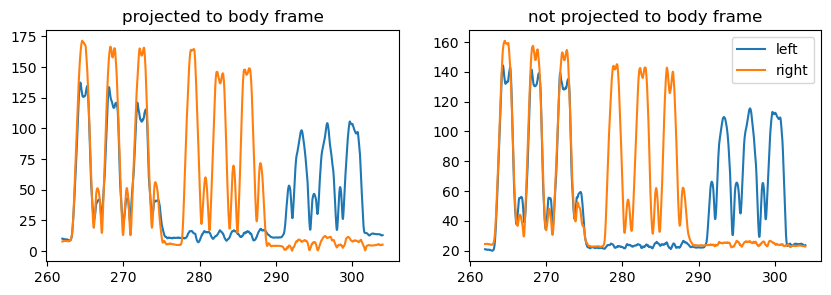

In [356]:
leftshoulder_abduc = angle_plane(new_df_test, 'leftelbow', 'leftshoulder', 'coronal')
rightshoulder_abduc = angle_plane(new_df_test, 'rightelbow', 'rightshoulder', 'coronal')
t1, t2 = time_id(new_df_test, events['shoulder_abduc'][0], events['shoulder_abduc'][1])

fig = plt.figure(figsize=(10,3))
plt.subplot(1, 2, 1)
plt.plot(new_df_test['time'][t1:t2], leftshoulder_abduc[t1:t2], label = 'left')
plt.plot(new_df_test['time'][t1:t2], rightshoulder_abduc[t1:t2], label = 'right')
plt.title('projected to body frame')
plt.subplot(1, 2, 2)
plt.plot(df_test['time'][t1:t2], df_test['leftshoulder_abduc'][t1:t2], label = 'left')
plt.plot(df_test['time'][t1:t2], df_test['rightshoulder_abduc'][t1:t2], label = 'right')
plt.title('not projected to body frame')
plt.legend()

In [294]:
add_joint_angles(new_df_test)

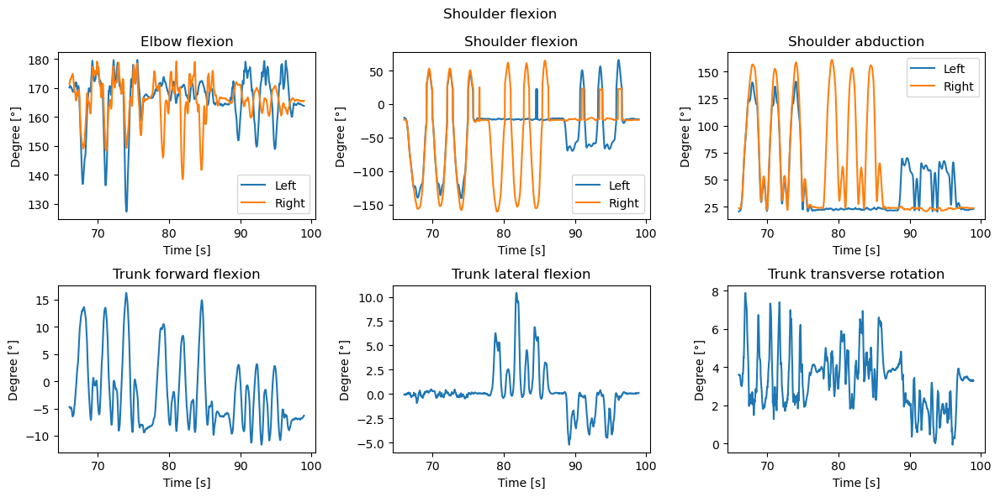

In [298]:
#plot_all_joints(df_test, 185, 188, 'Trunk rotation')
#plot_all_joints(df_test, 175, 179, 'Trunk lateral flexion')
#plot_all_joints(df_test, 171, 175, 'Trunk forward flexion')
#plot_all_joints(df_test, 159, 163, 'Shoulder abduction')
plot_all_joints(new_df_test, 66, 99, 'Shoulder flexion')

# OH0037, M, middle-aged, ambidextrous

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## Load data

In [271]:
#Load data
data_path = "../data/OH0037.csv"
data = pd.read_csv(data_path)
df = data[['rgb_frameid', 'kp3ds']]
#Convert data into float values and get body points
df['kp3ds'] = df['kp3ds'].apply(str2float)
df_points = get_df_points(df)
df = pd.concat([df, df_points], axis=1)
df.drop(columns=['kp3ds'], inplace=True)
#Convert frameid into time
df['rgb_frameid'] = (df['rgb_frameid'])/30
df.rename(columns={'rgb_frameid': 'time'}, inplace=True)
df.rename(columns = {'point_0': 'nose', 'point_1': 'lefteye',
                          'point_2': 'righteye', 'point_3': 'leftear', 'point_4': 'rightear',
                          'point_5':'leftshoulder', 'point_6':'rightshoulder', 
                          'point_8':'rightelbow', 'point_7':'leftelbow', 
                          'point_10':'rightwrist', 'point_9':'leftwrist',
                          'point_12':'righthip', 'point_11':'lefthip',
                          'point_13': 'leftknee', 'point_14': 'rightknee',
                          'point_15': 'leftfoot', 'point_16': 'rightfoot'}, inplace = True)
#To convert into meters
df = df/1000
joints = ['leftshoulder_flex', 'rightshoulder_flex', 'leftshoulder_abduc',
       'rightshoulder_abduc', 'leftelbow_flex', 'rightelbow_flex',
       'trunk_forward_flex', 'trunk_lateral_flex', 'trunk_rotation']

# Add joints DoF
add_joint_angles(df)
add_joint_velocities(df, joints)
df.head(2)

,time,nose,lefteye,righteye,leftear,rightear,leftshoulder,rightshoulder,leftelbow,rightelbow,...,trunk_rotation,leftshoulder_flex_w,rightshoulder_flex_w,leftshoulder_abduc_w,rightshoulder_abduc_w,leftelbow_flex_w,rightelbow_flex_w,trunk_forward_flex_w,trunk_lateral_flex_w,trunk_rotation_w
0,0.000000,"[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]",...,NaN,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.000033,"[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]","[0.0, 0.0, 0.0]",...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [268]:
# Convert all points to meters
joints = ['nose', 'lefteye', 'righteye', 'leftear', 'rightear',
       'leftshoulder', 'rightshoulder', 'leftelbow', 'rightelbow',
       'leftwrist', 'rightwrist', 'lefthip', 'righthip', 'leftknee',
       'rightknee', 'leftfoot', 'rightfoot']

## Get features

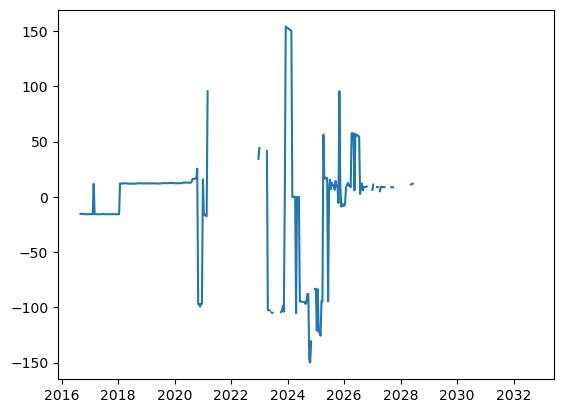

In [25]:
plt.plot(df['time'][60500:61000], df['leftshoulder_flex'][60500:61000])

In [ ]:

fig = px.scatter_3d(x = [point[0] for point in df['leftelbow'][60500:61000]], 
                    y = [point[1] for point in df['leftelbow'][60500:61000]], 
                    z = [point[0] for point in df['leftelbow'][60500:61000]])
fig.show()

In [94]:
#plt.plot(df['leftshoulder_flex'][60000:61000])
def plot_trajectory(data, t1, t2, joint, event):
    xdata = [point[0] for point in data[joint][t1: t2]]
    ydata = [point[1] for point in data[joint][t1: t2]]
    zdata = [point[2] for point in data[joint][t1: t2]]

    fig = px.line_3d(x = xdata, y = ydata, z = zdata, title=f'{joint} while {event}')
    fig.show()
    """
    fig = plt.figure(figsize=(10,10))
    ax = plt.axes(projection='3d')
    ax.scatter3D(xdata, ydata, zdata, c=zdata, cmap='Greens')
    ax.set_title(f'{joint} trajectory when {event}')
    """
plot_trajectory(df, 60500, 61000, 'leftelbow', 'blbl')

ValueError: The truth value of an array with more than one element is ambiguous. Use a.any() or a.all()

In [84]:
df['leftelbow'][60000:61000].shape[0]

500

Exception ignored in: <function TransformNode.set_children.<locals>.<lambda> at 0x183479a80>
Traceback (most recent call last):
  File "/Users/changling/opt/anaconda3/envs/skproject/lib/python3.11/site-packages/matplotlib/transforms.py", line 209, in <lambda>
    self, lambda _, pop=child._parents.pop, k=id(self): pop(k))

KeyboardInterrupt: 


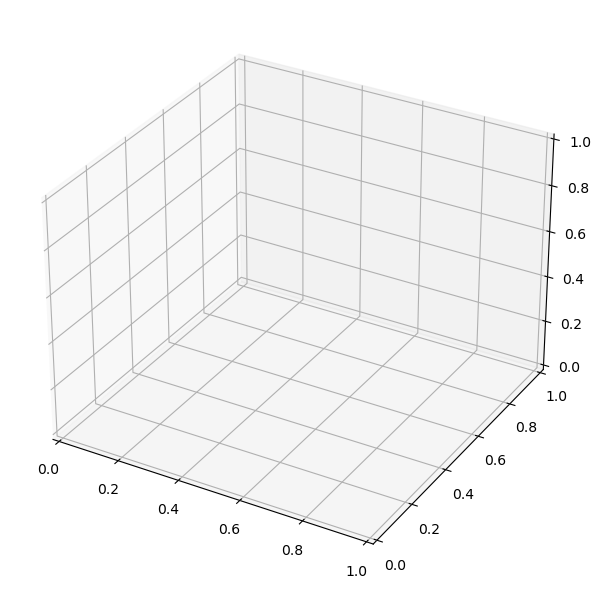

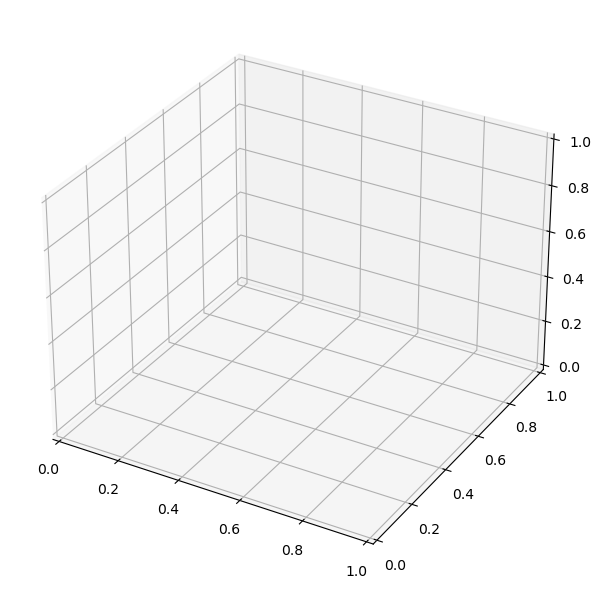

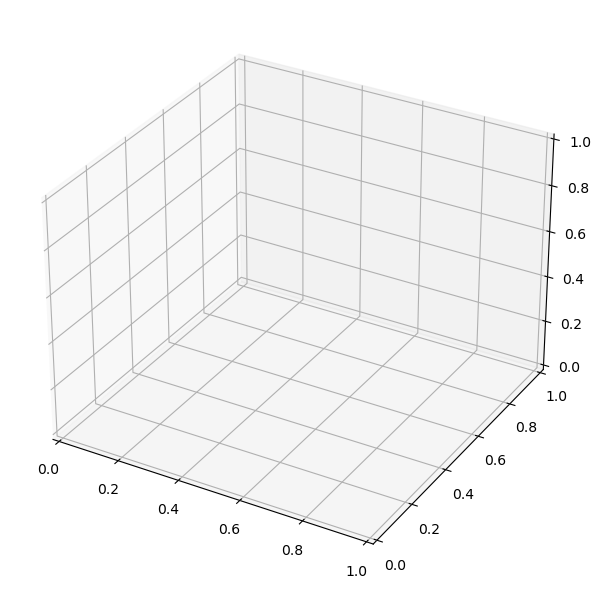

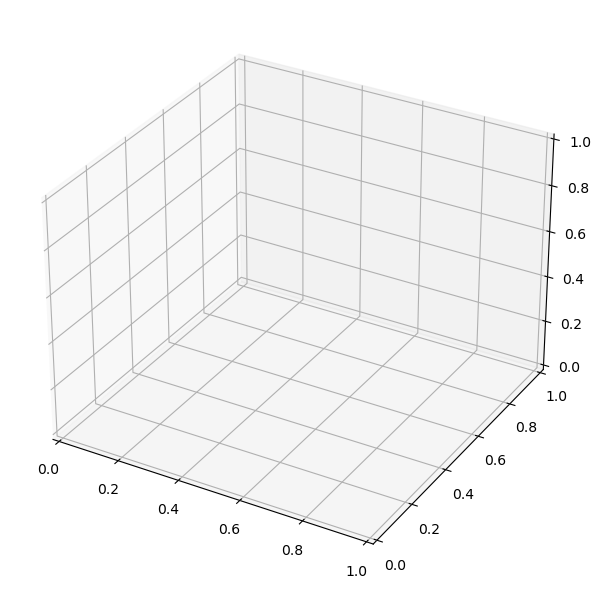

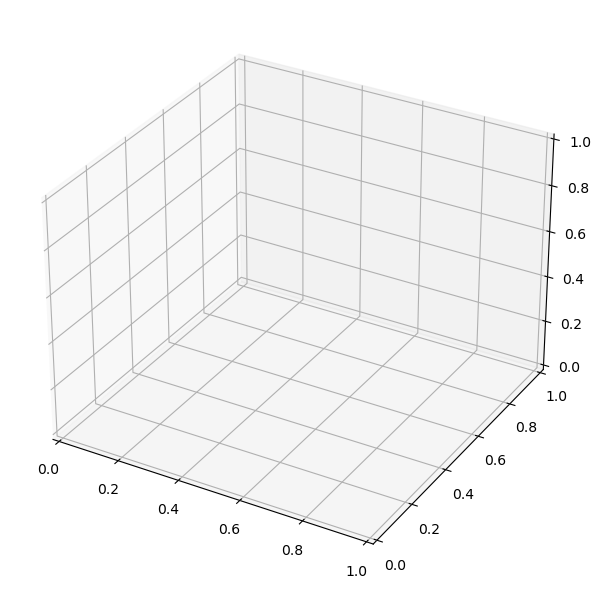

...

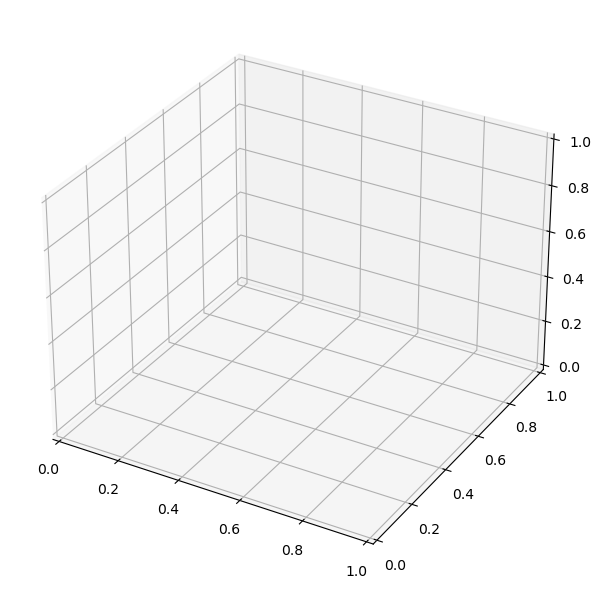

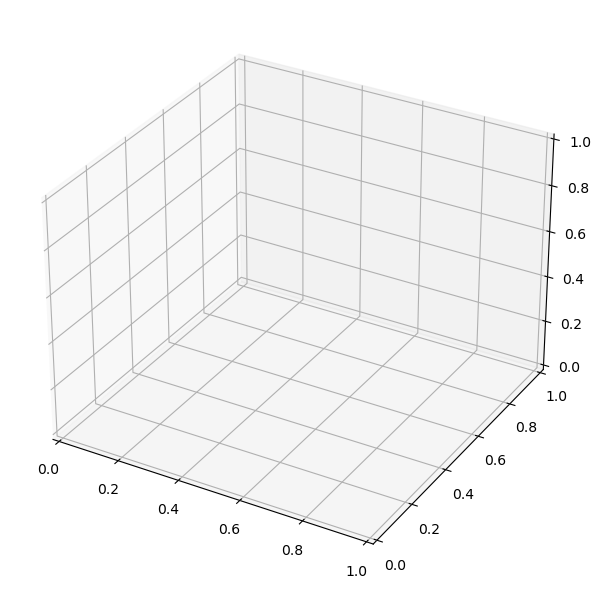

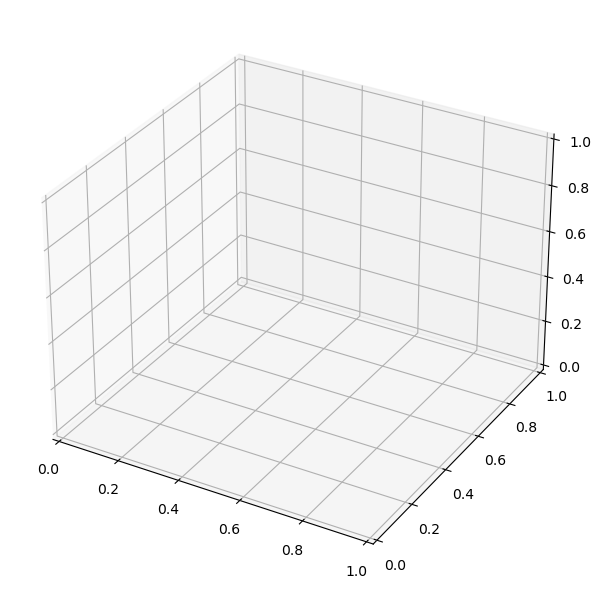

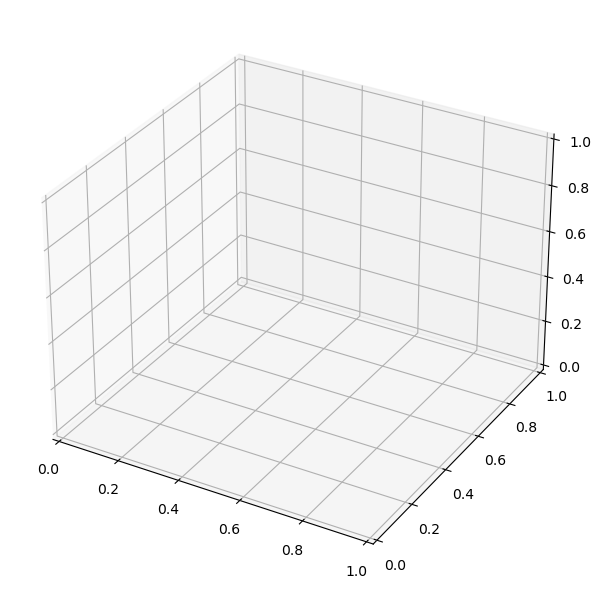

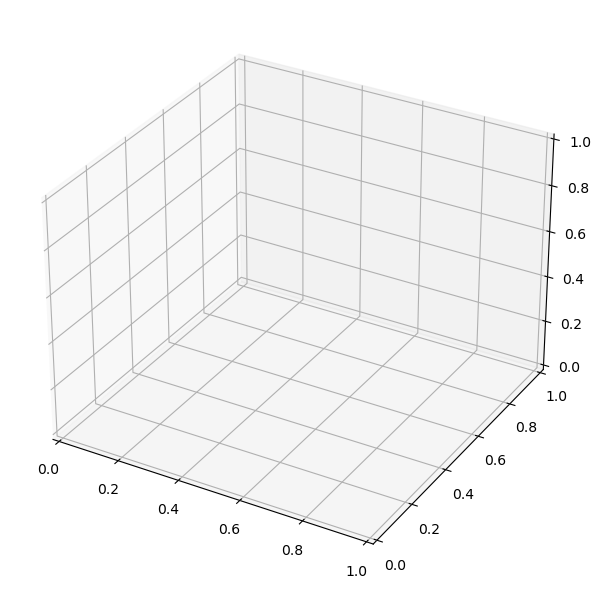

In [180]:
skeleton_frames(df, 3500, 3600)


(<unknown>:79890): GStreamer-CRITICAL **: 10:33:16.466: gst_element_make_from_uri: assertion 'gst_uri_is_valid (uri)' failed
[ WARN:0@28715.058] global /Users/ec2-user/ci_py311/opencv-suite_1678377996177/work/modules/videoio/src/cap_gstreamer.cpp (2180) open OpenCV | GStreamer warning: cannot link elements


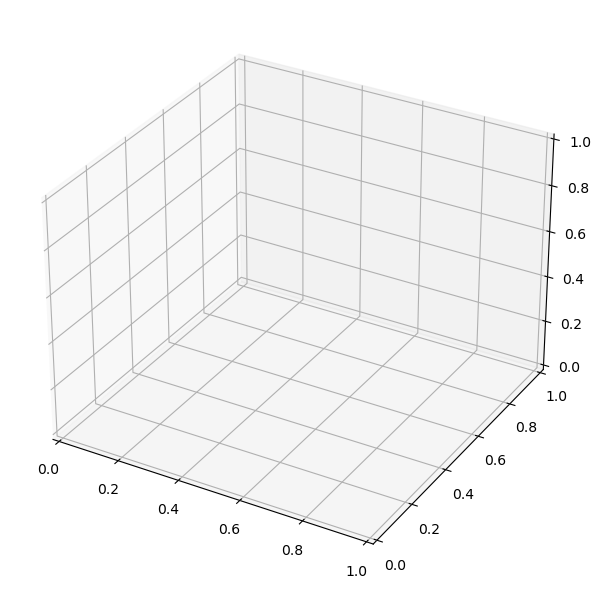

In [253]:
video_skeleton('my_data6', df, 2000, 2010)